# Bonusleistung Paket 4 Teil 3
### Aus der Schulung Soziale Netzwerkanalyse 

Ich habe mich für die Bearbeitung dieser Schulung für ein sehr ähnliches Dataset entschieden. Meine Umsetzung basiert auf Daten von Game of Thrones. Damit die visualisierung noch halbwegs lesbar bleibt nutze ich nur Figuren aus dem ersten Buch.

In [2]:
import networkx as nx
from matplotlib import pyplot as plt
import numpy as np 
import pandas as pd

#### Einlesen der Daten

In [3]:
df = pd.read_csv("game_of_thrones.csv")
df

,Source,Target,Type,weight,book
0,Addam-Marbrand,Jaime-Lannister,Undirected,3,1
1,Addam-Marbrand,Tywin-Lannister,Undirected,6,1
2,Aegon-I-Targaryen,Daenerys-Targaryen,Undirected,5,1
3,Aegon-I-Targaryen,Eddard-Stark,Undirected,4,1
4,Aemon-Targaryen-(Maester-Aemon),Alliser-Thorne,Undirected,4,1
...,...,...,...,...,...
679,Tyrion-Lannister,Willis-Wode,Undirected,4,1
680,Tyrion-Lannister,Yoren,Undirected,10,1
681,Tywin-Lannister,Varys,Undirected,4,1
682,Tywin-Lannister,Walder-Frey,Undirected,8,1


### Zuordnung der Kanten 

Methode 1:

In [4]:
M = nx.Graph()
for i in range (0, len(df)):
    M.add_edge(df['Source'].iloc[i], df['Target'].iloc[i], distance = df['weight'].iloc[i])

Methode 2:

In [5]:
SW_graph = nx.from_pandas_edgelist(df,source = "Source", target="Target")

In [6]:
type(SW_graph)

networkx.classes.graph.Graph

### Informationen zum Graphen

In [20]:
print(f"Anzahl Knoten: {SW_graph.number_of_nodes()}\nAnzahl Kanten: {SW_graph.number_of_edges()}")
# Andere Möglichkeit:
print(nx.info(SW_graph))

Anzahl Knoten: 187
Anzahl Kanten: 684
Graph with 187 nodes and 684 edges


### Graphen Visualisieren 1
Erste einfache Visualisierung

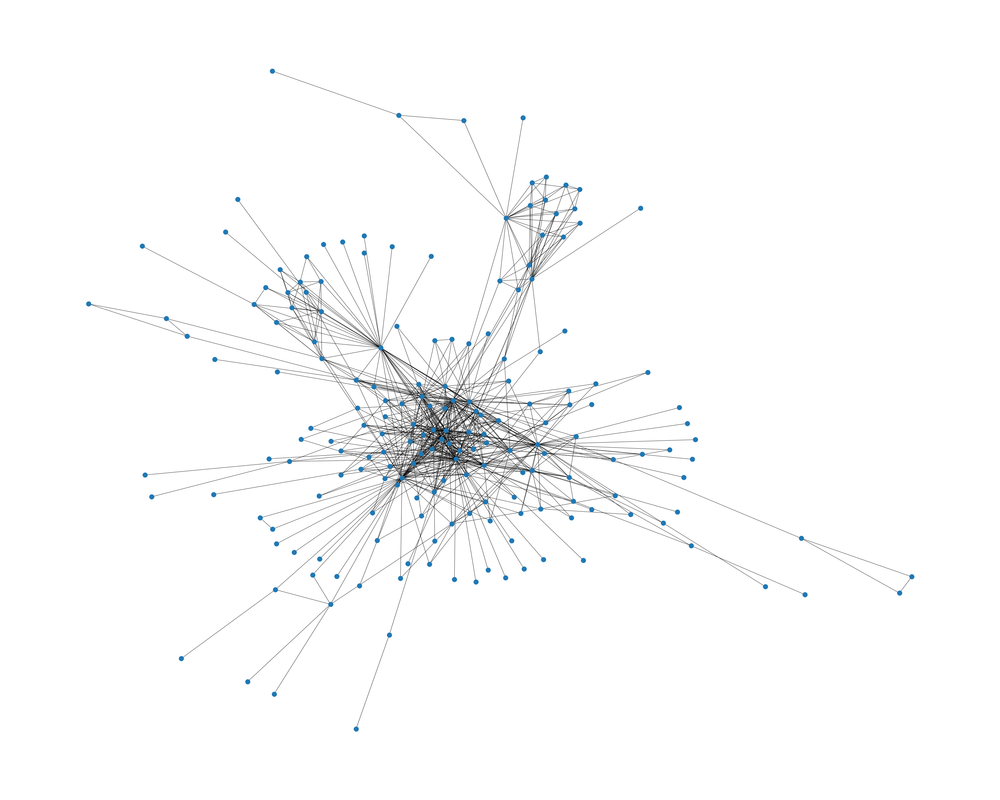

In [37]:
G = nx.Graph(SW_graph)
plt.figure(figsize = (50,40))
nx.draw(G)

**Probleme an diesem Graphen:**     
Die Knoten haben keine Beschriftung und können daher nicht identifiziert werden. Außerdem wird keine Gewichtung der Knoten beachtet, sodass jeder Knoten "gleich wichtig" aussieht (Hauptcharaktere sind nicht erkennbar)

### Graphen Visualisieren 2
Zweite Visualisierung mit mehr Informationen

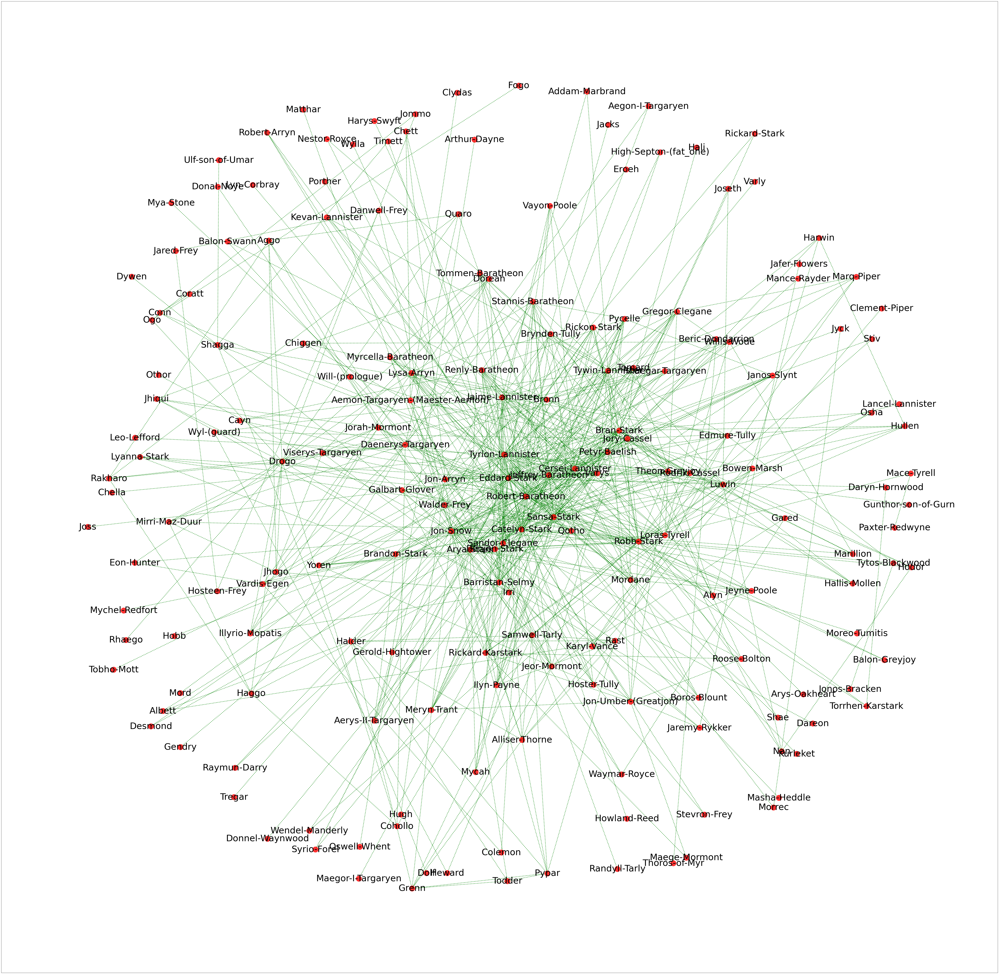

In [9]:
plt.figure(figsize = (100,100))
layout = nx.spring_layout(G, k = 0.8)
nx.draw_networkx_nodes(G, pos=layout, node_size = 1000, alpha = 0.8, node_color= "red")
nx.draw_networkx_edges(G, pos=layout, width = 3, style = 'dotted', edge_color = 'green')
nx.draw_networkx_labels(G, pos=layout, font_size = 50)
plt.show()

**Anmerkungen zu diesem Graphen:**    
Hier ist nun eine Beschriftung der Knoten dazu gekommen. Dadurch lassen sich diese nun identifizieren welchen Charakter sie darstellen. Außerdem sind die Beschriftungen durch andere Farben besser lesbar. Was aber immernoch fehlt ist die Gewichtung der Knoten. Es lässt sich nicht erkennen welcher Charakter eine größere Rolle spielt als der andere.

# Anwendung PageRank und Louvian-Methode 

### PageRank Algorithmus 

In [10]:
# Anwendung des Page Rank Algorithmus 
p_rank = nx.pagerank(M)

In [11]:
# Die Namen von den PageRank Values trennen 
keys = p_rank.keys()
values = p_rank.values()

#DataFrame mit den Namen zu den zugehörigen PageRanks machen
df1 = pd.DataFrame(keys, columns = ['Name'])
df1["ID"] = df1.index + 1

#DataFrame mit den Werten des PageRanks machen
df2 = pd.DataFrame(values, columns = ['Werte'])
df2["ID"] = df2.index + 1

# Beide DataFrames auf der Attribut ID zusammenführen 
df_merge = pd.merge(df1, df2, on = 'ID')

# Attribut ID rausstreichen
df_filter = df_merge[['Name','Werte']]

# DataFrame nach den Werten des PageRank absteigend sortieren 
dfPageRank = df_filter.sort_values(by=['Werte','Name'], ascending=False)

# Ersten zehn Zeilen des DataFrames ausgeben
dfPageRank.head(10)

,Name,Werte
5,Eddard-Stark,0.045502
30,Tyrion-Lannister,0.033014
39,Catelyn-Stark,0.030190
18,Robert-Baratheon,0.029825
12,Jon-Snow,0.026841
51,Robb-Stark,0.021559
54,Sansa-Stark,0.019998
38,Bran-Stark,0.019941
1,Jaime-Lannister,0.017501
40,Cersei-Lannister,0.017075


Mithilfe des PageRank Algorithmus lassen sich nun Aussagen darüber treffen, welche Charaktere eine größere Rolle spielen als die anderen. Da meine Auswertung nur auf dem ersten Buch basiert ist hier Eddard Stark an erster Stelle. Würde man alle Bücher zusammen nehmen sähe das ganze wahrscheinlich anders aus.

### Graphen mit den PageRank Werten zeichnen 

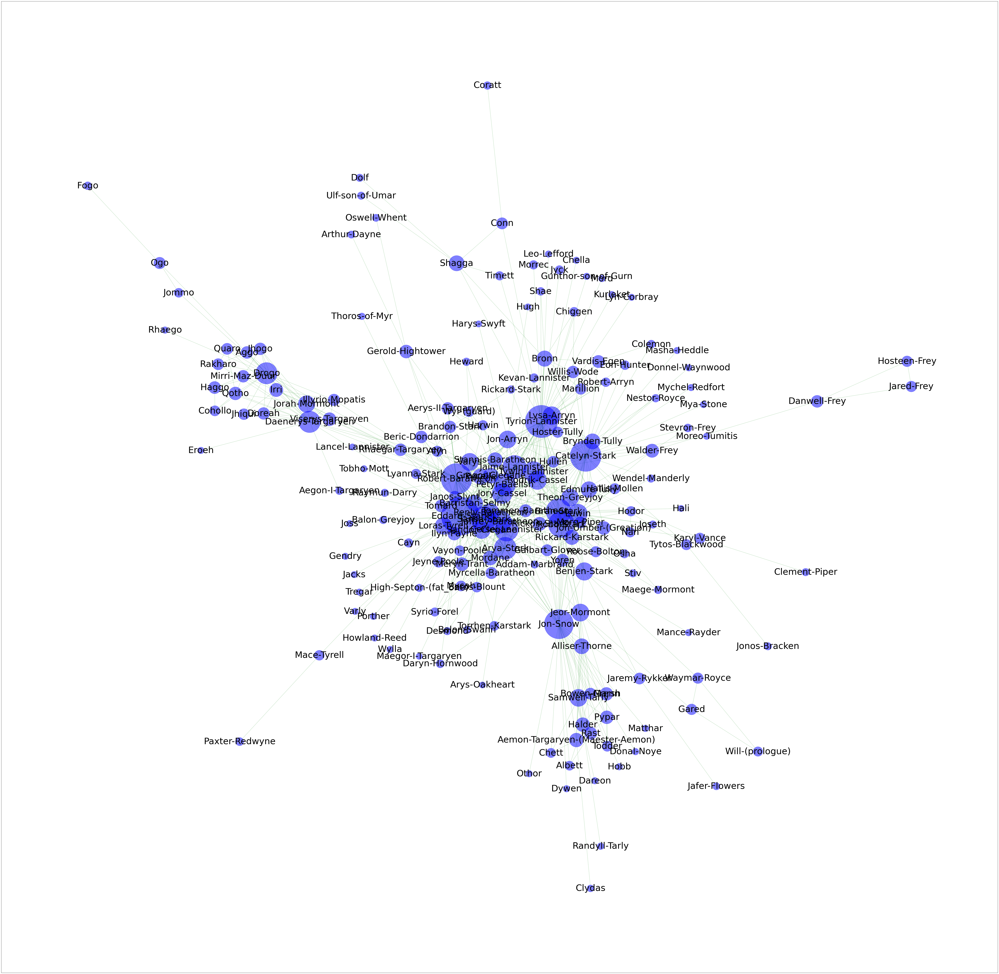

In [29]:
plt.figure(figsize = (100,100))
layout = nx.spring_layout(M)
nx.draw_networkx_labels(M, pos=layout, font_size = 50)
nx.draw_networkx_nodes(M, pos=layout, node_size = [v * 1000000 for v in p_rank.values()], alpha = 0.5, node_color= "blue") 
nx.draw_networkx_edges(M, pos=layout, width = 1, style = 'dotted', edge_color = 'green')
plt.show()

**Anmerkungen zu diesem Graphen:**    
Die Werte des PageRank-Algorithmus wurden nun mit in die Visualisierung aufgenommen. Der Wert des entsprechenden Charakters entscheidet über die Größe des Knotens. Dadurch ist es nun möglich zu sehen welcher Charakter eine größere Rolle in Game of Thrones (1. Buch) spielt und wer nicht.

### Louvian-Methode 

In [30]:
import community as community_louvain
import matplotlib.cm as cm
import networkx as nx

# Louvian Methode durchführen
partition = community_louvain.best_partition(M)

In [31]:
# Namen und die gefundenen Cluster trennen
keys = partition.keys()
values = partition.values()

# DataFrame mit den Namen der Charakteren erstellen
df1 = pd.DataFrame(keys, columns = ['Name'])
df1["ID"] = df1.index + 1

# DataFrame mit den Communitys der Charaktere erstellen
df2 = pd.DataFrame(values, columns = ['Community'])
df2["ID"] = df2.index + 1

# Beide DataFrames auf der ID Spalte zusammenführen
df_merge = pd.merge(df1, df2, on = 'ID')

# ID Spalte entfernen
df_filter = df_merge[['Name','Community']]

# DataFrame in Abhängigkeit der Community aufsteigend sortieren
dfLouvian = df_filter.sort_values(by=['Community','Name'], ascending=True)

In [35]:
#dfLouvian ausgeben und überprüfen wie viele Cluster identifiziert wurden
print(f"Anzahl Cluster: {len(dfLouvian['Community'].unique())}")

Anzahl Cluster: 7


Nochmals alle Cluster des Louvian visuell dargestellt

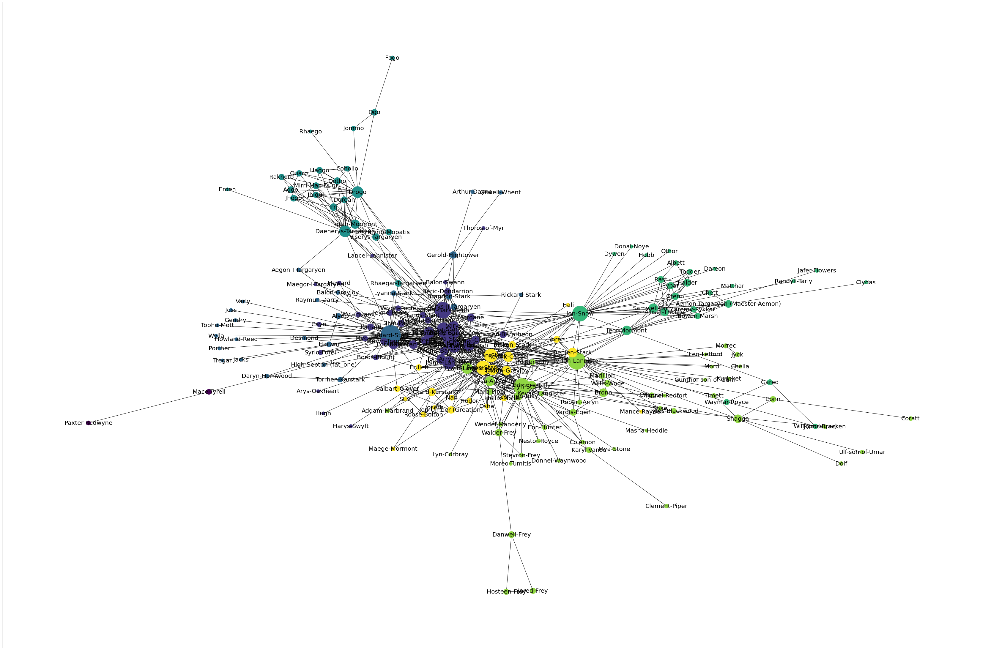

In [38]:
pos = nx.spring_layout(M)
# Nodefarbe nach der Community ausgeben und Nodes nach der Größe des PageRank ausgeben
plt.figure(figsize = (60,40))
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx(M, pos, partition.keys(), node_size=[v * 100000 for v in p_rank.values()], cmap= cmap,
                        node_color=list(partition.values()), width=1.0, alpha=1, font_size = 20)
plt.show()

# Traveling Salesman Problem 


Der Traveling Salesman Problem Algorithmus findet den kürzesten Weg innerhalb eines Netzwerk von einem Knoten zu einem anderen Knoten. Diesen Algorithmus wollen wir nun auf unsere Star Wars Netzwerk anwenden. 

Bestimmen Sie dafür den kürzesten Weg von SHMI zu KYLO REN. Tragen Sie den Weg der Knoten unten ein.



Wie könnte man dieses Ergebnis in unserem Kontext interpretieren?




(Uns ist bewusst, dass wir dieses Thema nicht in unserem Referat behandelt haben. Deshalb ist das hier nur als Bonusaufgabe aufgeführt)

In [39]:
from networkx.algorithms import approximation 

tsp = nx.approximation.traveling_salesman_problem
  
tsp(M, nodes = ['Daenerys-Targaryen', 'Jon-Snow'], cycle = False)    #In dem Befehl Links die Charaktere eintragen

['Jon-Snow', 'Eddard-Stark', 'Daenerys-Targaryen']

In [42]:
tsp(M, nodes = ['Fogo', 'Dolf'], cycle = False)

['Dolf',
 'Shagga',
 'Tyrion-Lannister',
 'Robert-Baratheon',
 'Drogo',
 'Ogo',
 'Fogo']

### Zusatz: 3D Modell des Netzwerks
Ich habe zusätzlich noch versucht das Netzwerk mithilfe von Plotly als 3D-Modell darzustellen. Das Modell hat noch ein paar Fehler aber sieht schonmal rech gut aus.

In [27]:
import igraph as ig
import plotly.graph_objs as go

#Numbers of Nodes
N = SW_graph.number_of_nodes()

#List of Edge
L = SW_graph.number_of_edges()

#Graph objects
Edges_name = [e for e in SW_graph.edges()] #Edges Names

Edges= nx.convert_node_labels_to_integers(SW_graph) #Mapping all Nodes into Numbers
Edges = [e for e in Edges.edges()]

#Graph
G = ig.Graph(Edges, directed = False)

# Geolocalization
layt = G.layout('kk',dim = 3)  #3D Localization

#Given X,y,z Position
Xn=[layt[k][0] for k in range(N)]# x-coordinates of nodes
Yn=[layt[k][1] for k in range(N)]# y-coordinates
Zn=[layt[k][2] for k in range(N)]# z-coordinates

Xe=[]
Ye=[]
Ze=[]

#Grouping Coordinates
for e in Edges:
    Xe+=[layt[e[0]][0],layt[e[1]][0], None]# x-coordinates of edge ends
    Ye+=[layt[e[0]][1],layt[e[1]][1], None]
    Ze+=[layt[e[0]][2],layt[e[1]][2], None]
    
#Nodes Name 
labels = []
group = []

for i in range(len(Edges_name)):
    value = Edges_name[i][0]
    labels.append(value)
    
for i in range(len(Edges)):
    value = Edges[i][0]
    group.append(value)
    
group =[]
group.extend(np.repeat(1,2000))
group.extend(np.repeat(2,2000))
group.extend(np.repeat(3,3000))
group.extend(np.repeat(4,1000))
group.extend(np.repeat(5,2000))

trace1=go.Scatter3d(x=Xe,y=Ye,z=Ze,mode='lines',
                    line=dict(color='rgb(125,125,125)', width=1),hoverinfo='none')

trace2=go.Scatter3d(x=Xn,y=Yn,z=Zn,mode='markers+text',name='SuperHeroe',
                    marker=dict(symbol='circle',size=4,color=group,colorscale='Viridis',line=dict(color='rgb(50,50,50)', width=0.5)),
                    text=labels,hoverinfo='text')

axis=dict(showbackground=False,showline=False,zeroline=False,
          showgrid=False,showticklabels=False,title='')

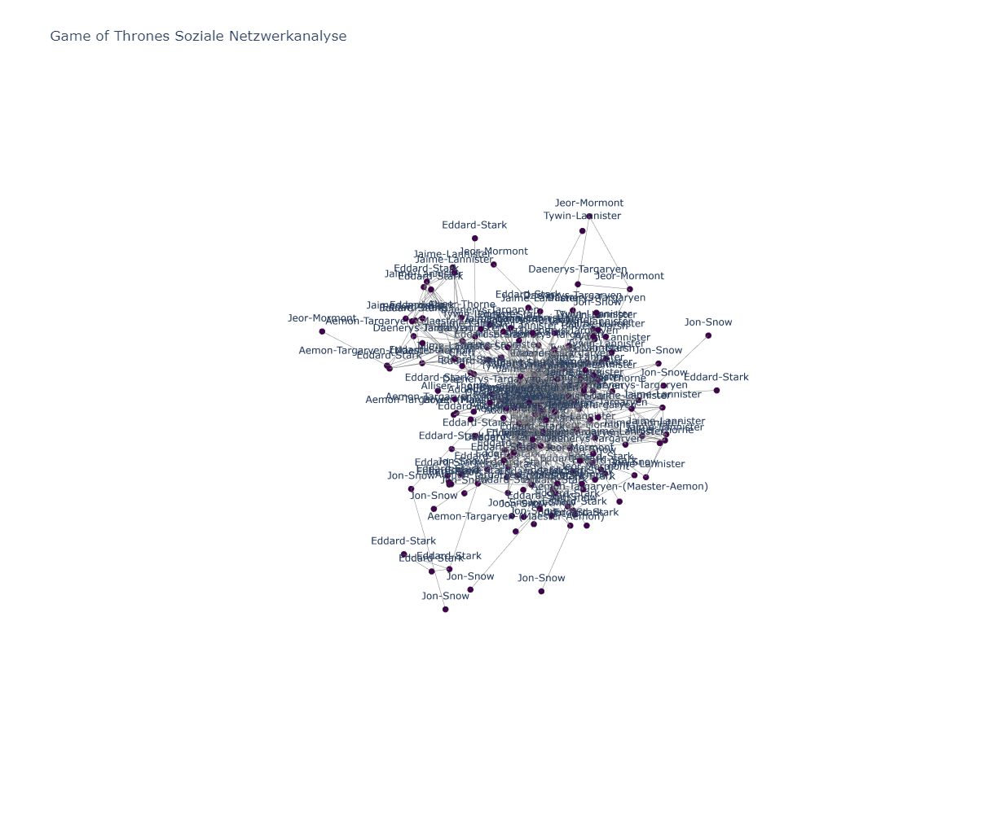

In [43]:
layout = go.Layout(
         title="Game of Thrones Soziale Netzwerkanalyse",
    autosize=True,
         width=1000,
         height=1000,
         showlegend=False,
         scene=dict(
             xaxis=dict(axis),
             yaxis=dict(axis),
             zaxis=dict(axis),
        ),
     margin=dict(
        t=100
    ),
    hovermode='closest', )

data=[trace1, trace2]
fig=go.Figure(data=data, layout=layout)
fig.show()


# Fazit    
Insgesamt war ich sehr überrascht, dass mir ausgerechnet diese Übung am leichtesten gefallen ist.    
Bei fast allen anderen Übungen/Schulungen mit eigenem Dataset hatte ich viele Probleme und musst eigene Umsetzungen entwickeln. Hier war das nicht der Fall. Fast alles hat direkt auf annhieb mit dem anderen Dataset funktioniert. Dazu muss man aber auch sagen, dass sich die beiden Datensätze vom Aufbau her sehr geähnelt haben.    
    
Dennoch fand ich diese Schulung eine der interessantesten von allen und es hat mir viel Spaß gemacht diese Schulung noch einmal mit anderen Daten umzusetzen.